In [1]:
import pickle

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import umap
from adjustText import adjust_text
from sklearn.metrics.pairwise import euclidean_distances

plt.rcParams["font.sans-serif"] = ["Noto Sans CJK SC"]

/home/ma-user/anaconda3/envs/chinese-idiom/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
def make_dict(keys, vectors):
    return dict(zip(keys, vectors))

In [3]:
idioms = pd.read_csv("../data/idioms.csv")["word"].to_list()
idioms_subset = pd.read_csv("../data/idiom_subset.csv")["word"].to_list()

In [4]:
texts = pd.read_csv("../data/test_input.csv")
# 从 test 中选 n_item 个 text
n_items = 20
np.random.seed(42)
chosen_idx = np.random.choice(texts.shape[0], n_items)
chosen_text = texts.iloc[chosen_idx]["explanation"].to_list()

# 选距离最近的 topk 个 
topk = 5

In [5]:
reducer = umap.UMAP(random_state=42, n_neighbors=25, min_dist=0.05)

### tao-8k
#### subset 降维

In [6]:
vectors = pickle.load(open("../output/tao-8k_vectors.pkl", "rb"))
vectors_dict = make_dict(idioms, vectors)
embedding = reducer.fit_transform([vectors_dict[idiom] for idiom in idioms_subset])
x, y = embedding[:, 0], embedding[:, 1]

/home/ma-user/anaconda3/envs/chinese-idiom/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


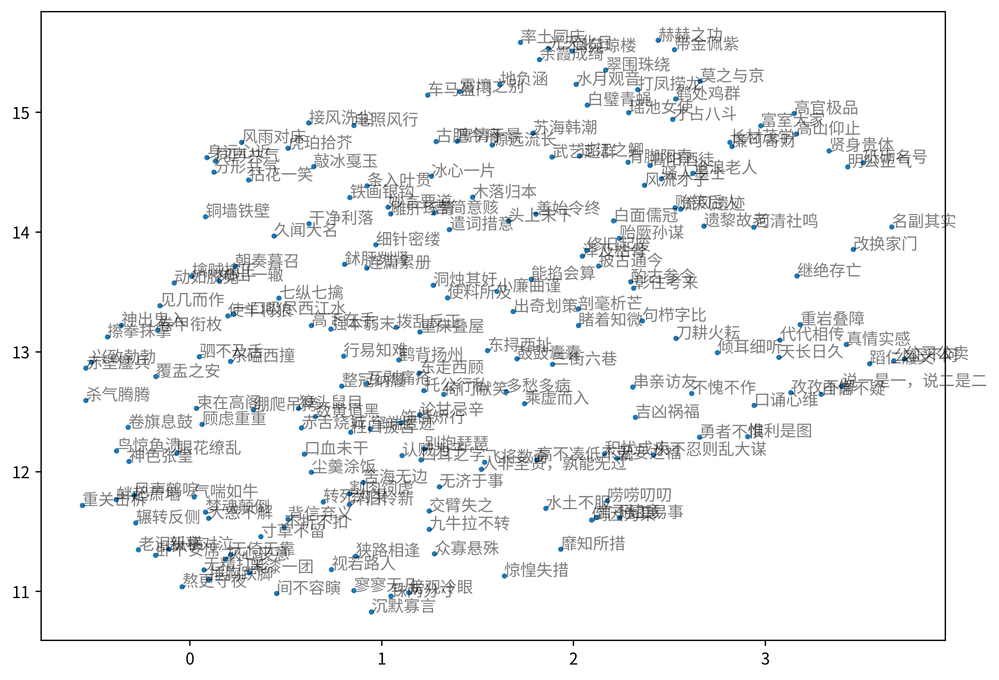

In [7]:
plt.figure(figsize=(10, 7), dpi=400)
plt.scatter(x, y, s=5)
for i, point in enumerate(zip(x, y)):
    plt.annotate(idioms_subset[i], point, alpha=0.5, fontsize=10)

plt.show()

#### 全部数据降维

In [8]:
embedding = reducer.fit_transform(vectors)
x, y = embedding[:, 0], embedding[:, 1]

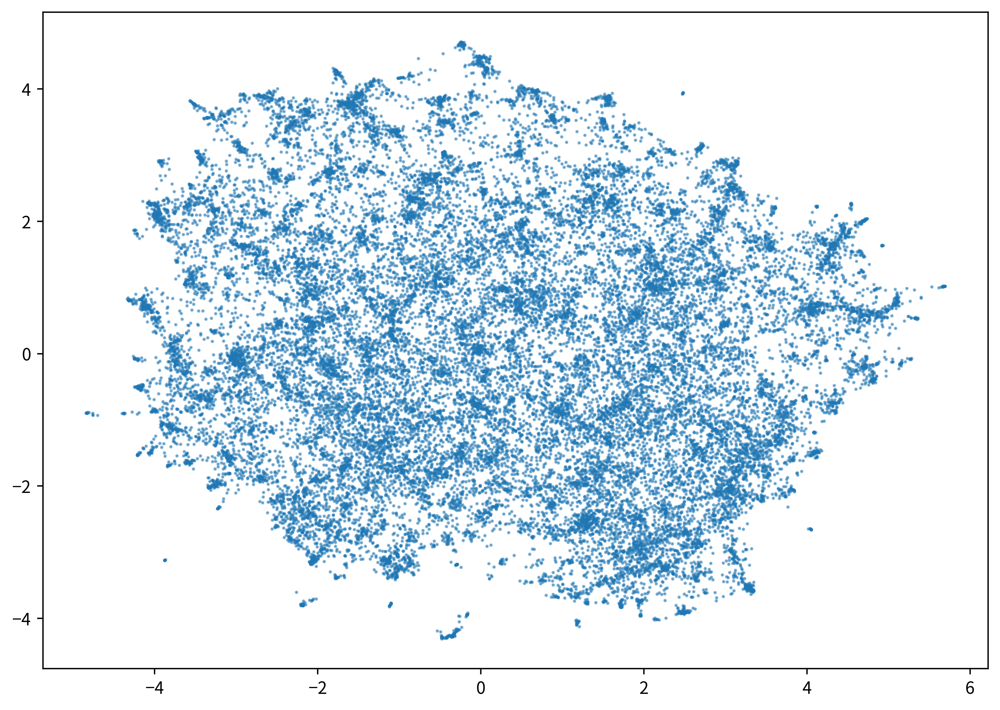

In [9]:
plt.figure(figsize=(10, 7), dpi=400)
plt.scatter(x, y, alpha=0.5, s=1)

plt.show()

#### 部分测试集匹配结果

In [10]:
text_vectors = pickle.load(open("../output/tao-8k_text_vectors.pkl", "rb"))[chosen_idx]
scores = euclidean_distances(text_vectors, vectors)
matched_idx = np.argsort(scores, axis=1)[:, :topk].ravel()
x, y = embedding[:, 0][matched_idx], embedding[:, 1][matched_idx]

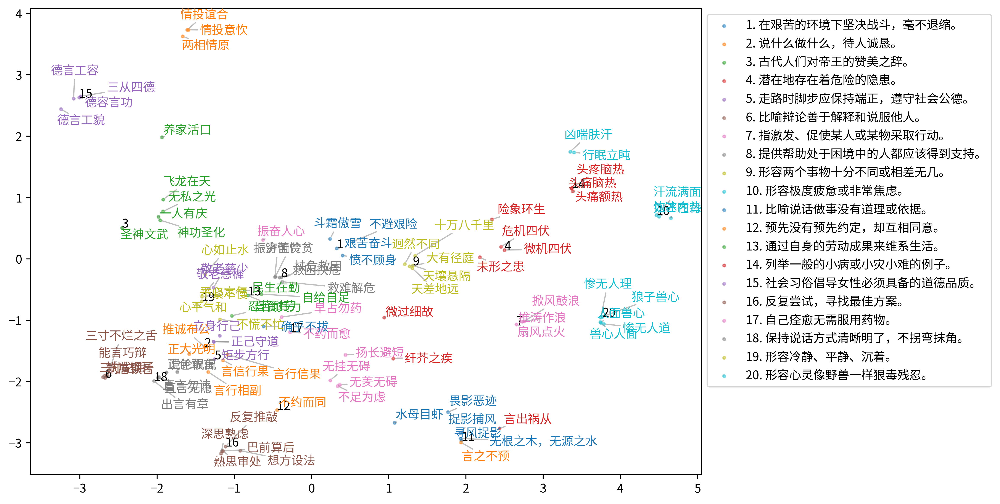

In [11]:
plt.figure(figsize=(10, 7), dpi=400)

clusters = [(x[i * topk : (i + 1) * topk], y[i * topk : (i + 1) * topk]) for i in range(n_items)]
for i, points in enumerate(clusters):
    plt.annotate(str(i + 1), (points[0][0], points[1][0]))
    plt.scatter(*points, alpha=0.5, s=5, c=f"C{i}", label=f"{i+1}. {chosen_text[i]}")


texts = [
    plt.text(*point, s=idioms[matched_idx[i]], c=f"C{i//topk}", size=10)
    for i, point in enumerate(zip(x, y))
]
adjust_text(texts, arrowprops=dict(arrowstyle="-", color="gray", alpha=0.5))

plt.legend(bbox_to_anchor=(1, 1))
plt.show()

### puff-base-v1
#### subset 降维

In [12]:
vectors = pickle.load(open("../output/puff-base-v1_vectors.pkl", "rb"))
vectors_dict = make_dict(idioms, vectors)
embedding = reducer.fit_transform([vectors_dict[idiom] for idiom in idioms_subset])
x, y = embedding[:, 0], embedding[:, 1]

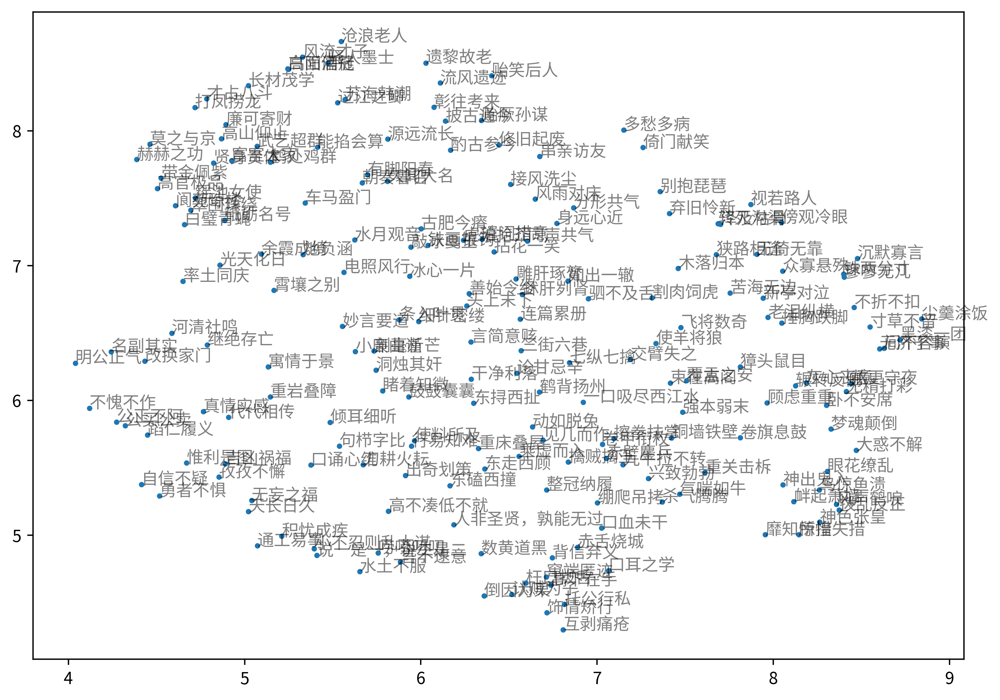

In [13]:
plt.figure(figsize=(10, 7), dpi=400)
plt.scatter(x, y, s=5)
for i, point in enumerate(zip(x, y)):
    plt.annotate(idioms_subset[i], point, alpha=0.5, fontsize=10)

plt.show()

#### 全部数据降维

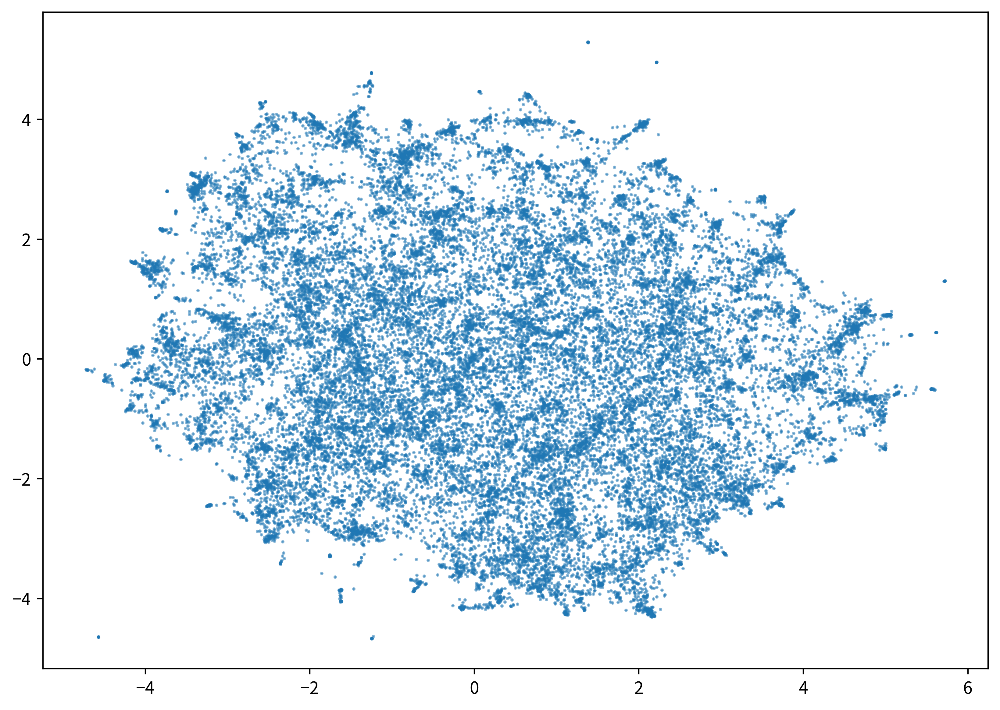

In [14]:
embedding = reducer.fit_transform(vectors)
x, y = embedding[:, 0], embedding[:, 1]
plt.figure(figsize=(10, 7), dpi=400)
plt.scatter(x, y, alpha=0.5, s=1)

plt.show()

#### 部分测试集匹配结果

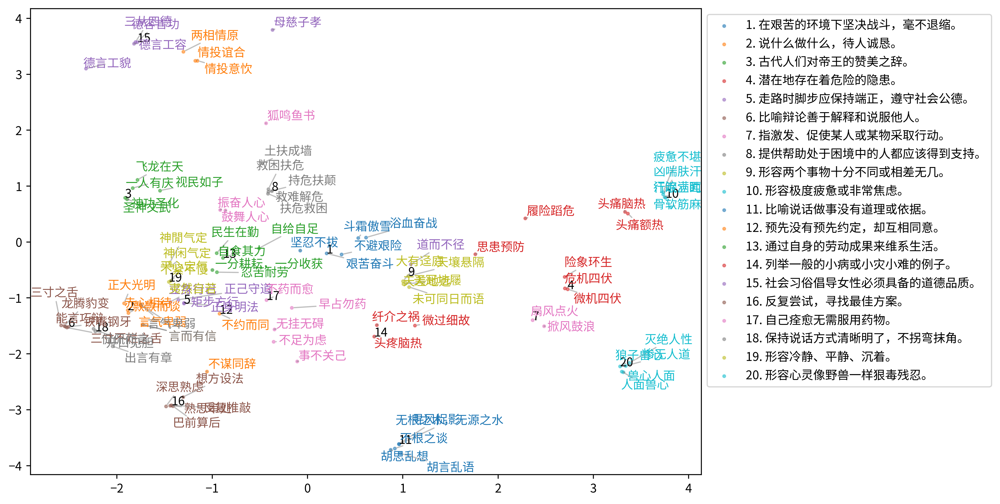

In [15]:
text_vectors = pickle.load(open("../output/puff-base-v1_text_vectors.pkl", "rb"))[chosen_idx]
scores = euclidean_distances(text_vectors, vectors)
matched_idx = np.argsort(scores, axis=1)[:, :topk].ravel()
x, y = embedding[:, 0][matched_idx], embedding[:, 1][matched_idx]

plt.figure(figsize=(10, 7), dpi=400)

clusters = [(x[i * topk : (i + 1) * topk], y[i * topk : (i + 1) * topk]) for i in range(n_items)]
for i, points in enumerate(clusters):
    plt.annotate(str(i + 1), (points[0][0], points[1][0]))
    plt.scatter(*points, alpha=0.5, s=5, c=f"C{i}", label=f"{i+1}. {chosen_text[i]}")


texts = [
    plt.text(*point, s=idioms[matched_idx[i]], c=f"C{i//topk}", size=10)
    for i, point in enumerate(zip(x, y))
]
adjust_text(texts, arrowprops=dict(arrowstyle="-", color="gray", alpha=0.5))

plt.legend(bbox_to_anchor=(1, 1))
plt.show()


## gte

In [16]:
# vectors = pickle.load(open("../data/gte_vectors.pkl", "rb"))
# vectors_dict = make_dict(idioms, vectors)
# embedding = reducer.fit_transform([vectors_dict[idiom] for idiom in idioms_subset])
# x, y = embedding[:, 0], embedding[:, 1]

In [17]:
# plt.scatter(x, y, s=5)
# for i, point in enumerate(zip(x, y)):
#     plt.annotate(idioms_subset[i], point, alpha=0.5, fontsize=7)

# plt.savefig("puff.svg", dpi=500)